# Предобработка данных

In [1]:
import numpy as np
import pandas as pd
from colorama import Fore, Back, Style

from eda_utils import *
from preprocessing_utils import transform_categories, correct_ceil, haversine_distance

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('houseprices.csv')

### Удаление объявлений о продаже квартир в новостройках

Цены на квартиры в новостройках обычно [дешевле](https://sovcombank.ru/blog/ipoteka/chto-vigodnee-novostroika-ili-vtorichnoe-zhile-?utm_referrer=https%3A%2F%2Fwww.google.com%2F). Особенно если квартира продается на этапе котлована. 

В наборе данных соотношение новостроек к квартирам на вторичном рынке примерно 1:3, поэтому уместно будет удалить их. Для того, чтобы отдельно построить модель, предсказывающую цены в новостройках данных недостатчно, поскольку изначально планировалось строить модель, предсказывающую цены на квартиры именно на вторичном рынке.

In [3]:
print(f"{Fore.GREEN}{Style.BRIGHT} Количество новостроек с учетом дубликатов:",end=" ")
print(f"{Fore.RED}{len(df[df['Название_новостройки'].notnull()])}{Style.RESET_ALL}")

print(f"{Fore.GREEN}{Style.BRIGHT} Вторичное жилье с учетом дубликатов:",end=" ")
print(f"{Fore.RED}{len(df[df['Название_новостройки'].isnull()])}{Style.RESET_ALL}")

 Количество новостроек с учетом дубликатов: 11000
 Вторичное жилье с учетом дубликатов: 32256


В объявлениях о продаже квартир в новостройках указывают название новостройки и отделку. Отделку также указывают в объявлениях о продаже квартир в новостройках, срок сдачи которых запланирован в 4 квартале 2022 года

In [4]:
df = df[(df['Название_новостройки'].isnull()) & (df['Отделка'].isnull())]

Удалим признаки характерные только для квартир в новостройках

In [5]:
cols_to_drop = df.isnull().sum()[lambda x: x == len(df)].index.tolist()
print(f"{Fore.GREEN}{Style.BRIGHT} Признаки для новостроек:")
print(f"{Fore.RED}{cols_to_drop}{Style.RESET_ALL}")
df = df.drop(columns=cols_to_drop)

 Признаки для новостроек:
['Отделка', 'Название_новостройки', 'Корпус_строение', 'Официальный_застройщик', 'Тип_участия', 'Срок_сдачи']


### Удаление старых объявлений

Поскольку цены на квартиры меняются каждый месяц, удалим старые объявления с датой публикации раньше, чем 1 декабря 2022 года.

Таким образом останутся объявления за декабрь 2022 - январь 2023
![Цены на квартиры по месяцам](https://www.irn.ru/graph/services/image.php?macrogeo=0&class=all&type=1&period=2&grnum=1&currency=0)

In [6]:
print(f"{Fore.GREEN}{Style.BRIGHT} Количество удаляемых объявлений:", end=" ")
print(f"{Fore.RED}{len(df[df['Дата']<'2022-12-01'])}{Style.RESET_ALL}")
df = df[df['Дата'] >= '2022-12-01']

 Количество удаляемых объявлений: 10


### Удаление дубликатов

Дубликаты будем искать по подмножеству признаков Адрес, Этаж, Количество комнат, Общая площадь

In [7]:
n_duplicates = df.duplicated(
    subset=['Адрес', 'Этаж', 'Количество_комнат', 'Общая_площадь'],
    keep='last').sum()

print(f"{Fore.GREEN}{Style.BRIGHT}Объявлений с дубликатами:", end=' ')
print(f"{Fore.RED}{n_duplicates}{Style.RESET_ALL}")

# удаление
df = df.drop_duplicates(
    subset=['Адрес', 'Этаж', 'Количество_комнат', 'Общая_площадь'],
    keep='last')

Объявлений с дубликатами: 4168


### Удаление объявлений о продаже квартир в домах, которые будут сносить

In [8]:
print(f"{Fore.GREEN}{Style.BRIGHT} Дома под снос:", end=" ")
print(f"{Fore.RED}{df['Запланирован_снос'].count()}{Style.RESET_ALL}")

# удаление
df = df[df['Запланирован_снос'].isnull()]
del df['Запланирован_снос']

 Дома под снос: 330


### Удаление объявлений о продаже доли или продажи с аукциона

Удалим обявления о продаже квартир, выставленных на аукцион, [поскольку](https://xn--h1alcedd.xn--d1aqf.xn--p1ai/instructions/kak-kupit-kvartiru-cherez-aukczion/) их цена может быть ниже рыночной. Также удалим объявления о продаже доли

In [9]:
df['Вид_сделки'].value_counts()

возможна ипотека                  15338
возможна ипотека, аукцион            73
продажа доли                         49
возможна ипотека, продажа доли       26
аукцион                              22
Name: Вид_сделки, dtype: int64

Добавим признак возможность покупки в ипотеку

In [10]:
df = df[(df['Вид_сделки'] == 'возможна ипотека') | (df['Вид_сделки'].isnull())]
df['Ипотека'] = df['Вид_сделки'].map({'возможна ипотека': 1, np.nan: 0})
del df['Вид_сделки']

### Удаление объявлений с альтернативным способом продажи

Оставим только объявления о свободной продаже, [поскольку](https://novostroev.ru/other/alternativnaya-prodazha-kvartiry-chto-eto-takoe/) при других способах продажи подразумевается участие нескольких сторон, а также цена может оказаться ниже рыночной

In [11]:
display(df['Способ_продажи'].value_counts())

df = df[df['Способ_продажи'] == 'свободная']
del df['Способ_продажи']

свободная         25504
альтернативная     1982
Name: Способ_продажи, dtype: int64

### Удаление объявлений о продаже квартир в деревянных домах

In [12]:
display(df['Тип_дома'].value_counts())

df = df[df['Тип_дома'] != 'деревянный']

панельный              8586
монолитный             8274
кирпичный              6029
блочный                1042
монолитно-кирпичный     843
монолитнокирпичный      723
деревянный                7
Name: Тип_дома, dtype: int64

### Удаление объявлений с выбросами в общей площади

Удалим объявления с аномально высокой или низкой площадью в зависимости от количества комнат. Выборочный анализ таких объявлений показал, что в них либо неверно указаны данные, либо данные не совпадают с выпиской из ЕГРН

In [13]:
index_to_drop = []

index_to_drop.extend(df[(df['Количество_комнат'] == 'студия')
                        & (df['Общая_площадь'] > 70)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '1')
                        & (df['Общая_площадь'] > 100)].index.tolist())
index_to_drop.extend(df[(df['Количество_комнат'] == '1')
                        & (df['Общая_площадь'] < 15)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '2')
                        & (df['Общая_площадь'] > 180)].index.tolist())
index_to_drop.extend(df[(df['Количество_комнат'] == '2')
                        & (df['Общая_площадь'] < 25)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '3')
                        & (df['Общая_площадь'] > 300)].index.tolist())
index_to_drop.extend(df[(df['Количество_комнат'] == '3')
                        & (df['Общая_площадь'] < 40)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '4')
                        & (df['Общая_площадь'] > 500)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '5')
                        & (df['Общая_площадь'] > 800)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '7')
                        & (df['Общая_площадь'] < 150)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '8')
                        & (df['Общая_площадь'] < 100)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '9')
                        & (df['Общая_площадь'] < 100)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '10 и больше')
                        & (df['Общая_площадь'] < 300)].index.tolist())

In [14]:
df = df.drop(index_to_drop)
print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 110


Посмотрим боксплоты общей площади в зависимости от количества комнат после очистки

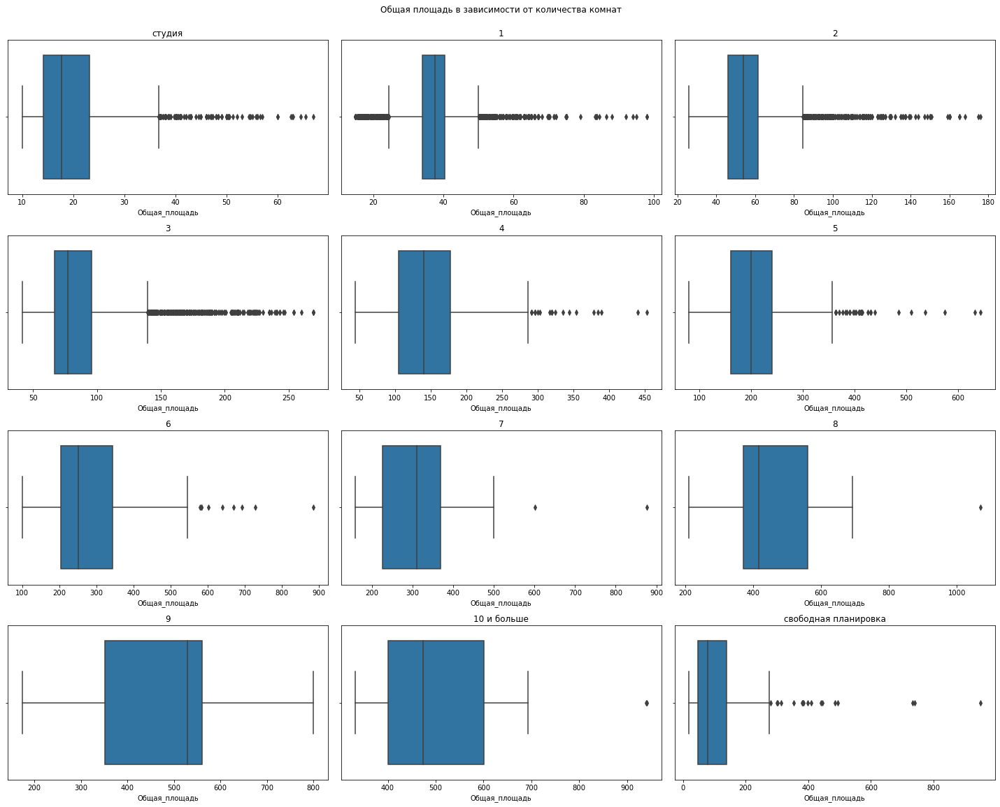

In [15]:
plot_feature_for_rooms(df, 'Общая_площадь')

### Удаление объявлений с выбросами в жилой площади

In [16]:
index_to_drop = []

index_to_drop.extend(df[(df['Количество_комнат'] == 'студия')
                        & (df['Жилая_площадь'] > 50)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '1')
                        & (df['Жилая_площадь'] < 7)].index.tolist())
index_to_drop.extend(df[(df['Количество_комнат'] == '1')
                        & (df['Жилая_площадь'] > 60)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '2')
                        & (df['Жилая_площадь'] < 10)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '3')
                        & (df['Жилая_площадь'] < 25)].index.tolist())

In [17]:
df = df.drop(index_to_drop)
print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 114


Посмотрим боксплоты жилой площади в зависимости от количества комнат после очистки

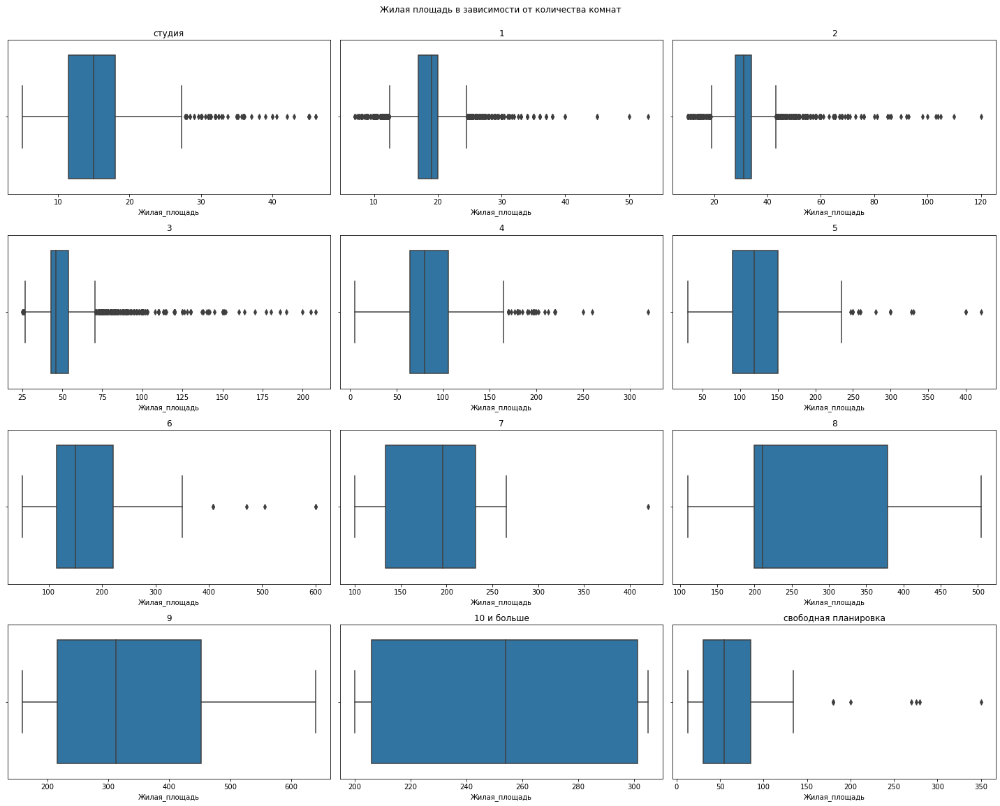

In [18]:
plot_feature_for_rooms(df, 'Жилая_площадь')

### Удаление объявлений с выбросами в площади кухни

In [19]:
index_to_drop = []

index_to_drop.extend(df[(df['Количество_комнат'] == '1')
                        & (df['Площадь_кухни'] > 45)].index.tolist())

index_to_drop.extend(df[(df['Количество_комнат'] == '9')
                        & (df['Площадь_кухни'] < 20)].index.tolist())

In [20]:
df = df.drop(index_to_drop)
print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 10


Посмотрим боксплоты площади кухни в зависимости от количества комнат после очистки

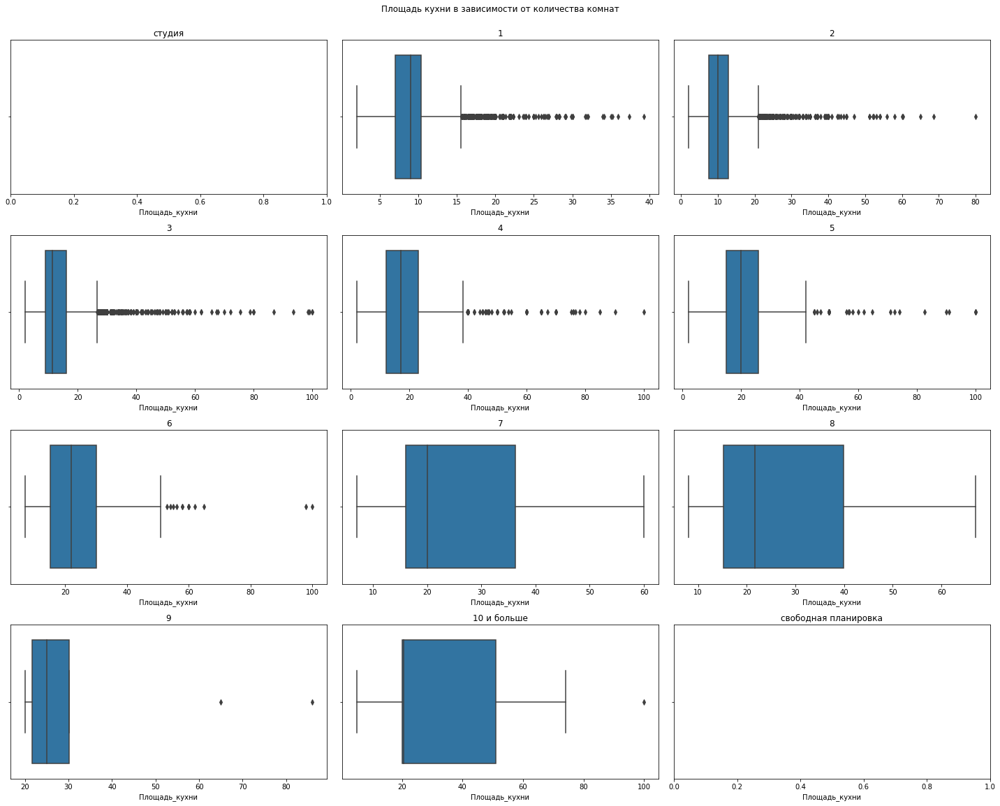

In [21]:
plot_feature_for_rooms(df, 'Площадь_кухни')

### Преобразование признака год постройки

Построим боксплот признака

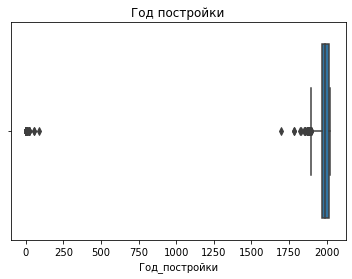

In [22]:
plot_feature_boxplot(df, 'Год_постройки')

In [23]:
df['Год_постройки'].describe()

count    14831.000000
mean      1938.387769
std        317.488792
min          0.000000
25%       1969.000000
50%       1992.000000
75%       2016.000000
max       2025.000000
Name: Год_постройки, dtype: float64

Удалим объявления, в которых год постройки дома больше 2022. В объявлениях, где год постройки равен 0 заменим его на nan 

In [24]:
df.loc[df['Год_постройки'] < 100, 'Год_постройки'] = np.nan
index_to_drop = df.loc[df['Год_постройки'] > 2022].index
df = df.drop(index_to_drop)

print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 57


Построим боксплот года постройки после очистки

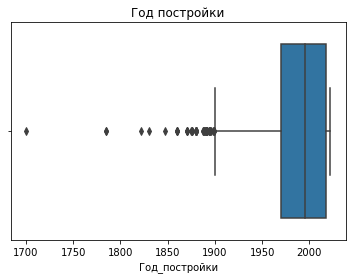

In [25]:
plot_feature_boxplot(df, 'Год_постройки')

### Преобразование признака высота потолков

По ошибке высота потолков была спаршена в виде число_м, например, 2.8м. Преобразуем значения

In [26]:
df['Высота_потолков'] = df['Высота_потолков'].str[:-1].astype(float)

Построим боксплот 

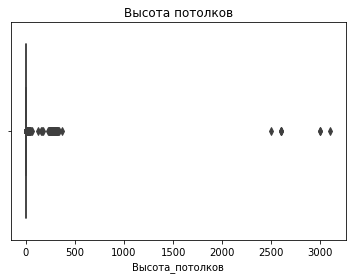

In [27]:
plot_feature_boxplot(df, 'Высота_потолков')

In [28]:
df['Высота_потолков'] = df['Высота_потолков'].apply(lambda x: correct_ceil(x))

Есть квартиры с высотой потолков от 15 до 20 метров и от 120 до 175 метров, удалим их, можно было бы счесть это за ошибку при заполнении и резделить на 10 в первом случае и на 100 во втором, однако тогда получится, что высота потолков ниже допустимой нормы.

[Норма](https://stone-floor.ru/stati/optimalnaya-visota-potolka#:~:text=%D0%A1%D0%B5%D0%B3%D0%BE%D0%B4%D0%BD%D1%8F%20%D0%BC%D0%B8%D0%BD%D0%B8%D0%BC%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B9%20%D0%BD%D0%BE%D1%80%D0%BC%D0%BE%D0%B9%20%D0%B2%20%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D0%B8,%D0%BF%D0%BE%D0%BA%D0%B0%D0%B7%D0%B0%D1%82%D0%B5%D0%BB%D1%8C%20%D0%BC%D0%BE%D0%B6%D0%B5%D1%82%20%D0%BF%D1%80%D0%B5%D0%B2%D1%8B%D1%88%D0%B0%D1%82%D1%8C%203%20%D0%BC%D0%B5%D1%82%D1%80%D0%B0.) на высоту потолков составляет 2.4м, с учетом стяжки и натяжного потолка можно снизить ее до 2.2м. Также удалим объявления с высотой потолков меньше 2.2м

In [29]:
index_to_drop = df.loc[(df['Высота_потолков'] > 15) |
                       (df['Высота_потолков'] < 2.2)].index
df = df.drop(index_to_drop)

print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 44


Я посмотрел объявления с высотой потолков больше 5 метров. Для квартир-студий, однокомнатных квартир и двухкомнатных либо высота потолков не соответсвует действительности, либо это объявление о продаже пентхаусов, цены на них будут сильно отличаться от рыночных, поэтому удалим такие объявления

In [30]:
index_to_drop = df.loc[(df['Высота_потолков'] > 5) & (
    df['Количество_комнат'].isin(['1', '2', 'студия']))].index
df = df.drop(index_to_drop)

print(f"{Fore.GREEN}{Style.BRIGHT} Удаляемые объявления:", end=" ")
print(f"{Fore.RED}{len(index_to_drop)}{Style.RESET_ALL}")

 Удаляемые объявления: 21


Построим боксплот очищенных данных

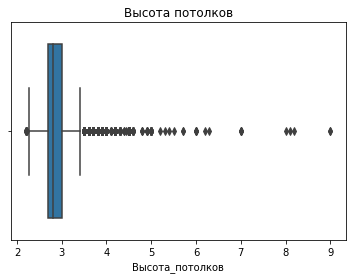

In [31]:
plot_feature_boxplot(df, 'Высота_потолков')

### Предобработка координат

Для каждого объявления добавим расстояние от дома до Кремля

In [32]:
df['Расстояние_до_Кремля'] = haversine_distance(df['Широта'], df['Долгота'],
                                                55.751999, 37.617734)

Удалим объявления с расстояним до Кремля, превышающим 95 квантиль

In [33]:
df = df[df['Расстояние_до_Кремля'] < df['Расстояние_до_Кремля'].quantile(0.95)]

Посмотрим на координаты объектов после преобразования

In [34]:
show_circles_on_map(df, 'Широта', 'Долгота', 'blue')

### Преобразование категориальных признаков

В таких столбах, как Окна, Мебель, Техника, В_доме, Парковка, Двор информация содержится в виде перечисления. Например, в столбце окна есть значения на солнечную сторону, во двор.

Преобразуем эти признаки. Для значений, приведенных в качестве примера получатся следующие столбцы: Окна_на_солнечную_сторону, Окна_во_двор со значениями 1, 0 или прупущенным значением, если автор объявления не указал эти данные 

In [35]:
df = transform_categories(
    df, ['Окна', 'Мебель', 'Техника', 'В_доме', 'Парковка', 'Двор'])

df.sample(5)

,ID,Ссылка,Цена,Дата,Адрес,Этаж,Количество_комнат,Балкон_или_лоджия,Тип_комнат,Общая_площадь,Жилая_площадь,Площадь_кухни,Высота_потолков,Санузел,Ремонт,Тёплый_пол,Тип_дома,Год_постройки,Этажей_в_доме,Пассажирский_лифт,Грузовой_лифт,Метро_1,Метро_2,Метро_3,Расстояние_до_метро_1,Расстояние_до_метро_2,Расстояние_до_метро_3,Широта,Долгота,Ипотека,Расстояние_до_Кремля,Окна_во_двор,Окна_на_солнечную_сторону,Окна_на_улицу,Мебель_спальные_места,Мебель_хранение_одежды,Мебель_кухня,Техника_кондиционер,Техника_микроволновка,Техника_стиральная_машина,Техника_утюг,Техника_посудомоечная_машина,Техника_водонагреватель,Техника_плита,Техника_фен,Техника_холодильник,Техника_телевизор,В_доме_мусоропровод,В_доме_газ,В_доме_консьерж,Парковка_за_шлагбаумом_во_дворе,Парковка_подземная,Парковка_наземная_многоуровневая,Парковка_открытая_во_дворе,Двор_закрытая_территория,Двор_спортивная_площадка,Двор_детская_площадка
4040,2412206104,https://avito.ru//moskva/kvartiry/2-k._kvartir...,12500000,2022-12-26,"Москва, улица Коккинаки, 1",1.0,2,NaN,изолированные,44.6,NaN,5.5,NaN,NaN,евро,NaN,панельный,NaN,5.0,NaN,NaN,Аэропорт,Петровский парк,Динамо,15.0,30.0,30.0,55.804364,37.543632,0,7.441661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15114,2439717757,https://avito.ru//moskva/kvartiry/1-k._kvartir...,14800000,2023-01-03,"Москва, Нагорная улица, 7к1",1.0,1,NaN,NaN,52.2,20.0,13.0,3.3,совмещенный,евро,есть,монолитно-кирпичный,2020.0,7.0,1,1,Нагатинская,Нагорная,Крымская,15.0,20.0,20.0,55.681163,37.610233,1,7.890603,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,1.0
31234,2812851020,https://avito.ru//moskva/kvartiry/4-k._kvartir...,75000000,2023-01-07,"Москва, Шмитовский пр., 39с5",15.0,4,NaN,изолированные,107.0,NaN,33.7,3.1,раздельный,дизайнерский,NaN,панельный,NaN,19.0,NaN,NaN,Шелепиха,Международная,Деловой центр МЦК,5.0,20.0,30.0,55.754005,37.524112,0,5.862757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10706,2508052744,https://avito.ru//moskva/kvartiry/1-k._kvartir...,9400000,2023-01-02,"Москва, улица Демьяна Бедного, 17к3",9.0,1,балкон,NaN,34.3,NaN,6.4,NaN,NaN,требует ремонта,NaN,панельный,NaN,9.0,NaN,NaN,Народное Ополчение,Хорошёво,Зорге,10.0,20.0,30.0,55.778730,37.485071,0,8.815153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
41272,2242313333,https://avito.ru//moskva/kvartiry/4-k._kvartir...,51000000,2023-01-12,"Москва, Страстной б-р, 4",3.0,4,NaN,изолированные,110.0,NaN,8.0,NaN,раздельный,евро,NaN,монолитный,NaN,7.0,NaN,NaN,Чеховская,Пушкинская,Тверская,5.0,5.0,5.0,55.765387,37.607772,0,1.613895,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Посмотрим на получившиеся значения

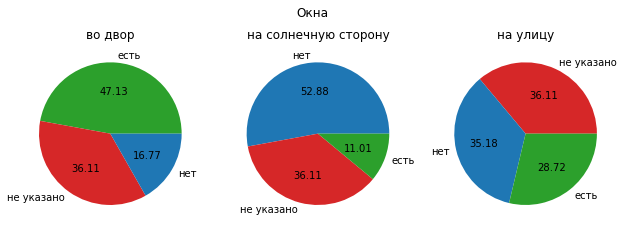

In [36]:
plot_pie_columns(df, 'Окна')

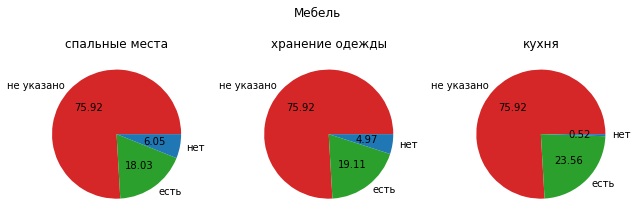

In [37]:
plot_pie_columns(df, 'Мебель')

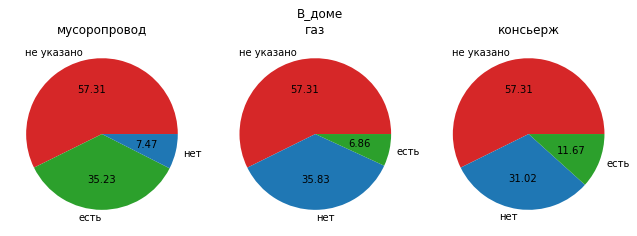

In [38]:
plot_pie_columns(df, 'В_доме')

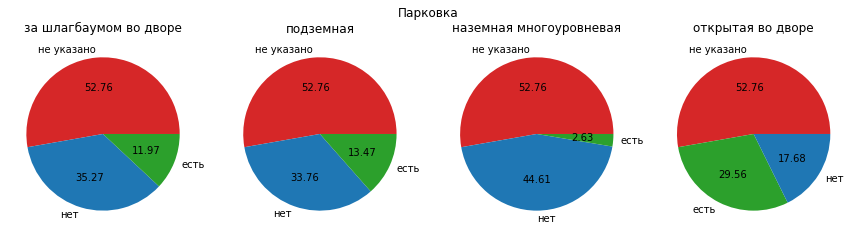

In [39]:
plot_pie_columns(df, 'Парковка')

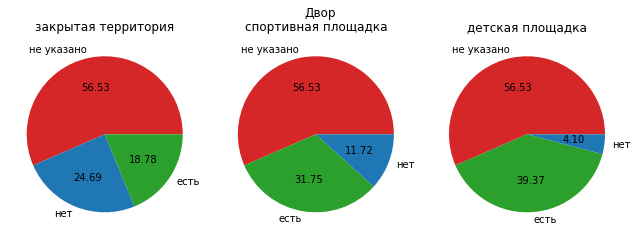

In [40]:
plot_pie_columns(df, 'Двор')

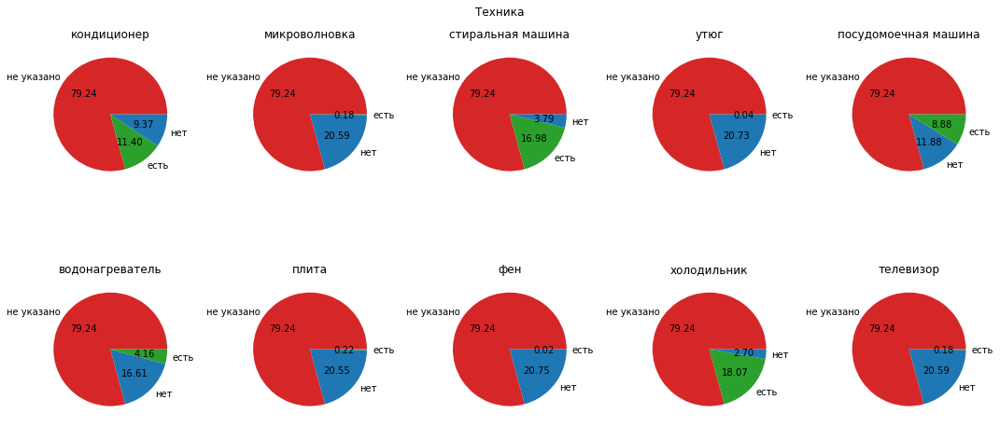

In [41]:
plot_pie_columns(df, 'Техника', n_rows=2)

Добавим бинарный признак наличие парковки, а типы парковки удалим

In [42]:
parking = df.filter(like='Парковка')
df['Парковка'] = parking.sum(axis=1).clip(0, 1)
df = df.drop(columns=parking.columns)

Авторы объявлений практически не указывали наличие техники, поэтому разумнее будет удалить признаки, связанные с техникой, поскольку они практически не несут в себе информации

In [43]:
technique = df.filter(like='Техника').columns
df = df.drop(columns=technique)

Преобразуем признак количество лифтов и создадим новый признак: общее количество лифтов

In [44]:
df = df.reset_index(drop=True)

df.loc[df['Пассажирский_лифт'] == 'нет', 'Пассажирский_лифт'] = 0
df['Пассажирский_лифт'] = df['Пассажирский_лифт'].fillna(0).astype('int8')

df.loc[df['Грузовой_лифт'] == 'нет', 'Грузовой_лифт'] = 0
df['Грузовой_лифт'] = df['Грузовой_лифт'].fillna(0).astype('int8')

df['Количество_лифтов'] = df['Пассажирский_лифт'] + df['Грузовой_лифт']

### Исправление станций метро
Исправим названия некоторых станций метро, которые были спаршены с ошибкой, а также исправим названия некоторых станций, чтобы они совпадали с названиями в наборе данных со всеми координатами и их станциями

In [45]:
metros = pd.read_csv('metro_coords.csv')
metros = metros.append(
    {
        'Станция': 'Сокольники',
        'Широта': 55.789236,
        'Долгота': 37.679661
    },
    ignore_index=True)

In [46]:
for i in range(1, 4):
    df.loc[df[f'Метро_{i}'] == 'Улица Дмитриевского',
           f'Метро_{i}'] = 'улица Дмитриевского'
    df.loc[df[f'Метро_{i}'] == 'ЮгоВосточная', f'Метро_{i}'] = 'Юго-Восточная'
    df.loc[df[f'Метро_{i}'] == 'АлмаАтинская', f'Метро_{i}'] = 'Алма-Атинская'
    df.loc[df[f'Метро_{i}'] == 'Деловой центр МЦК',
           f'Метро_{i}'] = 'Деловой центр'
    df.loc[df[f'Метро_{i}'] == 'Марьина Роща', f'Метро_{i}'] = 'Марьина роща'
    df.loc[df[f'Метро_{i}'] == 'Верхние котлы', f'Метро_{i}'] = 'Верхние Котлы'
    df.loc[df[f'Метро_{i}'] == 'Площадь революции',
           f'Метро_{i}'] = 'Площадь Революции'
    df.loc[df[f'Метро_{i}'] == 'Библиотека им Ленина',
           f'Метро_{i}'] = 'Библиотека имени Ленина'
    df.loc[df[f'Метро_{i}'] == 'Улица  года', f'Метро_{i}'] = 'Улица 1905 года'
    df.loc[df[f'Метро_{i}'] == 'Соколиная гора',
           f'Метро_{i}'] = 'Соколиная Гора'

    df[f'Метро_{i}'] = df[f'Метро_{i}'].fillna('нет')

### Преобразование целевой переменной

Будем прогнозировать не цену квартиры, а стоимость квадратного метра. Я провел эксперименты с целевой переменной и выяснил, что более точно модель прогнозирует именно стоимость квадратного метра

In [47]:
df['Цена_квм'] = df['Цена'] / df['Общая_площадь']

Посмотрим на цену квадратного метра 

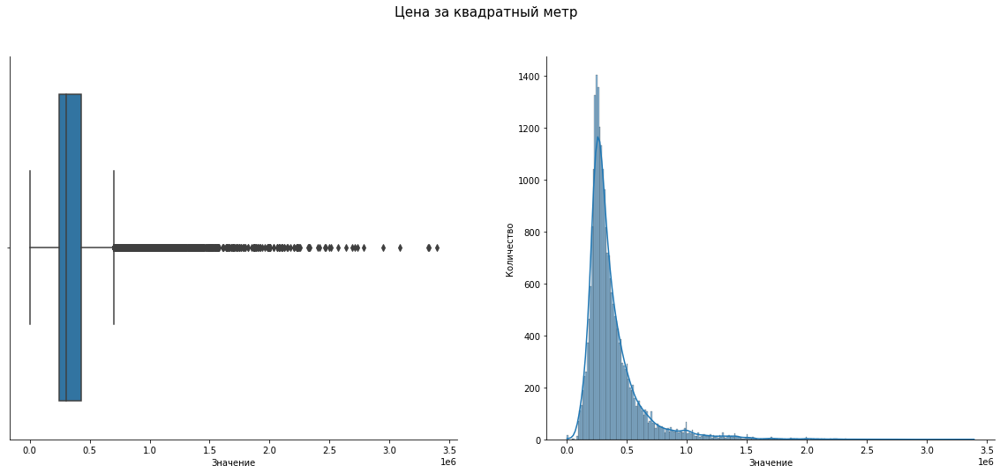

In [48]:
plot_numerical_feature(df, 'Цена_квм', title='Цена за квадратный метр')

Посмотрим на первые 20 значений цены, отсортированной по возрастанию

In [49]:
df['Цена'].sort_values().head(20)

13174          4
13183          5
13184          5
13186          5
13182          6
13175          6
13179          6
13180          6
13330         10
19753       4650
9787       14500
11228      60000
7721       80000
16830     300000
11409    1690000
2464     1800000
1871     2000000
2710     2090000
5125     2090000
1707     2090000
Name: Цена, dtype: int64

Очевидно, что значения цен от 1 до 300000 являются ошибочными. Удалим такие объявления

In [50]:
df = df[df['Цена'] > 1e6]

Очевидно, что значения цен от 1 до 300000 являются ошибочными. Удалим такие объявления

In [51]:
df = df[(df['Цена_квм'] < df['Цена_квм'].quantile(0.95))
        & (df['Цена_квм'] > df['Цена_квм'].quantile(0.01))]

Посмотрим на очищенную цену квадратного метра

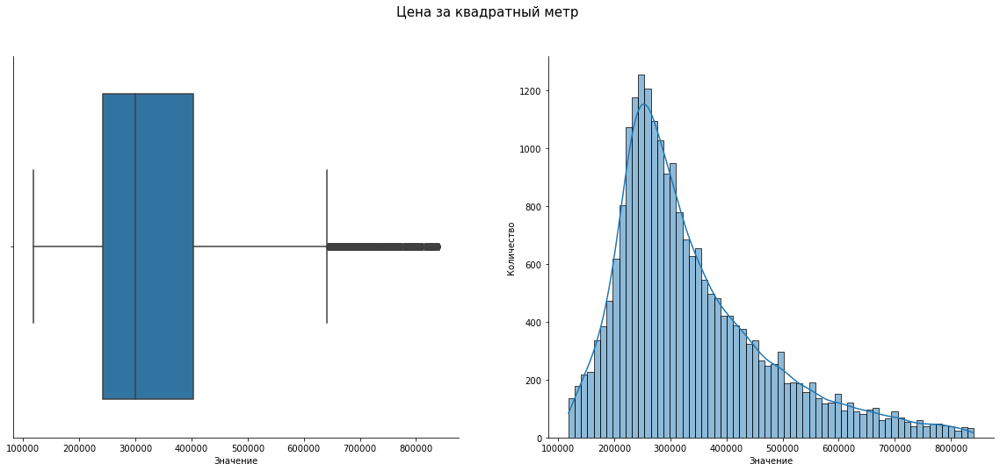

In [52]:
plot_numerical_feature(df, 'Цена_квм', title='Цена за квадратный метр')

### Сохранение

Удалим признак с большим количеством пропущенных значений

In [53]:
df = df.drop(columns='Тёплый_пол')

Для удобства при построении графиков зададим порядок на признаки количество комнат

In [54]:
n_rooms = [
    'студия', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10 и больше',
    'свободная планировка'
]
df['Количество_комнат'] = pd.Categorical(df['Количество_комнат'],
                                         categories=n_rooms,
                                         ordered=True)

Сохранение 

In [55]:
df = df.reset_index(drop=True)
df.to_csv('houseprices_cleaned.csv', index=None)